# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---
## Step 0: Load The Data

In [1]:
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cv2 as cv2
import pickle
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import os

%matplotlib inline

In [2]:
# Image augmantion helpers
from imgaug import augmenters as iaa

In [3]:
import numpy as np
import matplotlib.image as img
from plotly.offline import iplot,init_notebook_mode,download_plotlyjs
from plotly.graph_objs import *
init_notebook_mode();

In [4]:
import pandas as pandas
signs = pandas.read_csv("./signs.csv")
sign_names = signs[[signs.columns[1]]].values.squeeze()
signs

,ClassId,SignName
0,0,Speed limit (20km/h)
1,1,Speed limit (30km/h)
2,2,Speed limit (50km/h)
3,3,Speed limit (60km/h)
4,4,Speed limit (70km/h)
5,5,Speed limit (80km/h)
6,6,End of speed limit (80km/h)
7,7,Speed limit (100km/h)
8,8,Speed limit (120km/h)
9,9,No passing


In [5]:
# Load a pickle file
def load_pickle(file_path):
    with open(file_path, mode='rb') as f:
        file_data = pickle.load(f)
        return file_data;
# Create a pickle    
def create_pickle(file_path,data):
    pickle.dump(data, open(file_path, "wb" ))
    print("Data saved in", file_path)

In [6]:
train = []
test = []

In [7]:
# Load the original training and tesing dataset.
def load_default_datasets():
    training_file = "./train.p"
    testing_file = "./test.p"
    train = load_pickle(training_file)
    test  = load_pickle(testing_file)
    return (train,test);

In [8]:
train,test = load_default_datasets()

In [9]:
X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']

In [10]:
# Split the training into train and validation (80-20). reandom_state=0 for reproducibility
X_train,X_validation,y_train,y_validation = train_test_split(train['features'],train['labels'],test_size=0.2, random_state=0)

In [11]:
# Print Dataset Stats
def dump_dataset_sizes():
    print("X train shape {}".format(X_train.shape))
    print("X valid shape {}".format(X_validation.shape))
    print("X test  shape {}".format(X_test.shape))

    print("Y train shape {}".format(y_train.shape))
    print("y valid shape {}".format(y_validation.shape))
    print("y test  shape {}".format(y_test.shape))

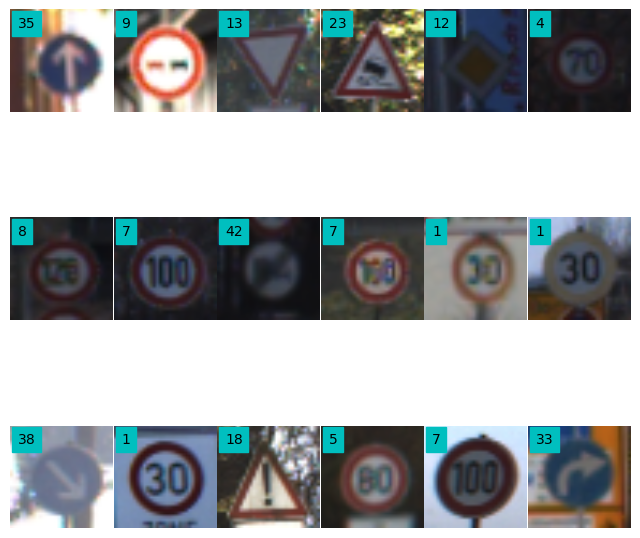

In [185]:
diaply_images(3,6,X_train,y_train);

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 1D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. 
**THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below.

In [12]:
dump_dataset_sizes()

X train shape (31367, 32, 32, 3)
X valid shape (7842, 32, 32, 3)
X test  shape (12630, 32, 32, 3)
Y train shape (31367,)
y valid shape (7842,)
y test  shape (12630,)


In [13]:
def display_distribution(X,Y,title="Dataset Set Distribution"):
    bin_count = np.bincount(Y)
    y_pos = np.arange(len(sign_names))
    plt.bar(y_pos, bin_count)
    plt.xticks(y_pos, np.arange(len(sign_names)))
    plt.ylabel('Occurance in dataset')
    plt.xlabel('Traffic sign id')
    plt.title(title)
    plt.show()


In [14]:
def rgb2gray(image):
    return np.sum(image/3, axis=3, keepdims=True)


def normalise_histogram(image):
    img_yuv = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    img_yuv[:,:,0] = clahe.apply(img_yuv[:,:,0])
    
    # convert the YUV image back to RGB format
    img_output = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)
    return img_output;



In [15]:
def number_of_images_in_class(dataset,class_id):
    count_by_class = np.bincount(dataset['labels'])
    return count_by_class[class_id];    

In [16]:
def preprocess_image(image):
    return normalise_histogram(image)
    

In [17]:
def diaply_images(rows,cols,images,labels):
    gs1 = gridspec.GridSpec(rows,cols)
    gs1.update(wspace=0.01, hspace=0.02)
    plt.figure(figsize=(8,8))
    for i in range(rows * cols):
        ax1 = plt.subplot(gs1[i])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')
        rnd_idx = np.random.choice(len(images))
        plt.text(2,5,
                 str(labels[rnd_idx]),
                 color='k',
                 backgroundcolor='c')
        plt.imshow(images[rnd_idx])
        plt.axis('off')

    plt.show()
    

In [74]:
def diaply_all_images(rows,cols,images,labels):
    gs1 = gridspec.GridSpec(rows,cols)
    gs1.update(wspace=0.01, hspace=0.02)
    plt.figure(figsize=(8,8))
    if (rows * cols) >= len(images):
        for i in range(rows * cols):
            if i >= len(images):
                break;
            ax1 = plt.subplot(gs1[i])
            ax1.set_xticklabels([])
            ax1.set_yticklabels([])
            ax1.set_aspect('equal')
            rnd_idx = i;
            plt.text(2,5,
                     str(labels[rnd_idx]),
                     color='k',
                     backgroundcolor='c')
            plt.imshow(images[rnd_idx])
            plt.axis('off')
    else:
        print("Cannot fit data in the given grid !!!")
    plt.show()
    

In [18]:
def diaply_images_by_class(rows,cols,images,labels,class_id):
    gs1 = gridspec.GridSpec(rows,cols)
    gs1.update(wspace=0.01, hspace=0.02)
    plt.figure(figsize=(8,8))
    for i in range(rows * cols):
        ax1 = plt.subplot(gs1[i])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')
        rnd_img_idx_by_class = np.random.choice(np.where( labels == class_id )[0])
        plt.text(2,5,
                 str(class_id),
                 color='k',
                 backgroundcolor='c')
        plt.imshow(images[rnd_img_idx_by_class])
        plt.axis('off')

    plt.show()    
    

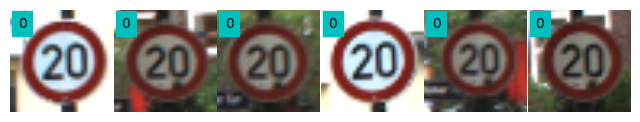

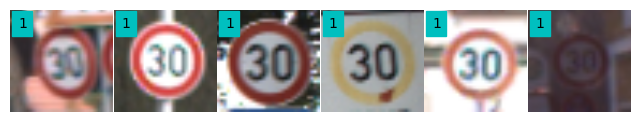

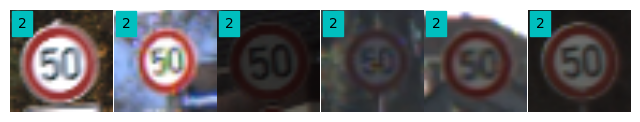

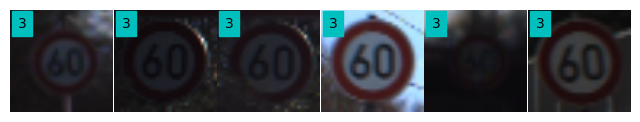

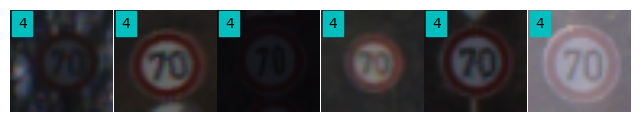

...

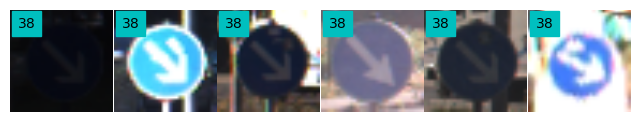

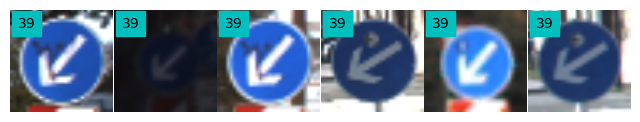

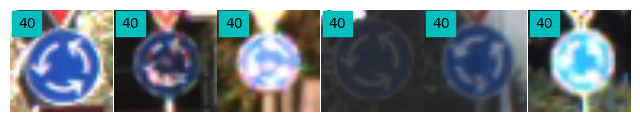

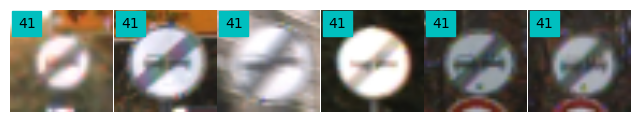

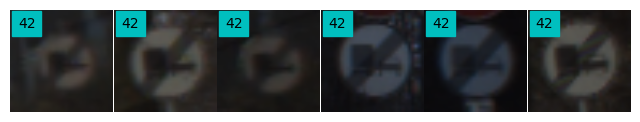

In [186]:
for i in range(43):
    diaply_images_by_class(1,6,X_train,y_train,i);

In [19]:
ia = iaa.ia
st = lambda aug: iaa.Sometimes(.5, aug)

# Define our sequence of augmentation steps that will be applied to every image
seq = iaa.Sequential([
        st(iaa.Crop(percent=(0, 0.1))), # crop images by 0-10% of their height/width
        st(iaa.Affine(
            translate_px={"x": (-8, 8), "y": (-8, 8)}, # translate by -16 to +16 pixels (per axis)
            rotate=(-20, 20), # rotate by -45 to +45 degrees
            shear=(-16, 16), # shear by -16 to +16 degrees
            order=ia.ALL, # use any of scikit-image's interpolation methods
            mode=ia.ALL # use any of scikit-image's warping modes (see 2nd image from the top for examples)
        )),
    ],
)

In [20]:
"""
  augmented_image_count : number of images to generate
  class_id              : Augment this class id 
"""
def augmentImages(augmented_image_count,class_id):
    # pick a random image from the class

    augmented_data_x = np.empty([augmented_image_count,32,32,3],dtype="uint8")
    augmented_data_y = np.zeros(augmented_image_count,dtype="uint8")
    augmented_data_y.fill(class_id);
    

    for i in range(augmented_image_count):
        classes = np.where( train['labels'] == class_id )[0];
#         rnd_img_idx_by_class = np.random.choice(np.where( train['labels'] == class_id )[0]) # normal dist
        rnd_img_idx_by_class = classes[int(np.round(np.random.uniform(0,len(classes)-1)))]    # uniform dist
        image = train['features'][rnd_img_idx_by_class]
        image = normalise_histogram(image);
        images_aug = seq.augment_images([image])
        augmented_data_x[i] = images_aug[0];
    return (augmented_data_x,augmented_data_y);
    
    
    

In [25]:
aug_x = None
aug_y = None
for img_class in range(43):
    print("Augmenting class ", img_class)
    no_of_samples = 2500 - number_of_images_in_class(train,img_class)  # bump all img count to 2500
    x,y = augmentImages(max(no_of_samples,1),img_class)
    if aug_x is None:
        aug_x = x
        aug_y = y
    else:
        aug_x = np.concatenate((aug_x,x))
        aug_y = np.concatenate((aug_y,y))


        
create_pickle("./dataset/augmented_train_balanced_uniform.p",{"features":aug_x,"labels":aug_y})



Augmenting class  0
Augmenting class  1
Augmenting class  2
Augmenting class  3
Augmenting class  4
Augmenting class  5
Augmenting class  6
Augmenting class  7
Augmenting class  8
Augmenting class  9
Augmenting class  10
Augmenting class  11
Augmenting class  12
Augmenting class  13
Augmenting class  14
Augmenting class  15
Augmenting class  16
Augmenting class  17
Augmenting class  18
Augmenting class  19
Augmenting class  20
Augmenting class  21
Augmenting class  22
Augmenting class  23
Augmenting class  24
Augmenting class  25
Augmenting class  26
Augmenting class  27
Augmenting class  28
Augmenting class  29
Augmenting class  30
Augmenting class  31
Augmenting class  32
Augmenting class  33
Augmenting class  34
Augmenting class  35
Augmenting class  36
Augmenting class  37
Augmenting class  38
Augmenting class  39
Augmenting class  40
Augmenting class  41
Augmenting class  42
Data saved in ./dataset/augmented_train_balanced_uniform.p


In [21]:
aug = load_pickle("./dataset/augmented_train_balanced_uniform.p")
aug_x = aug['features']
aug_y = aug['labels']

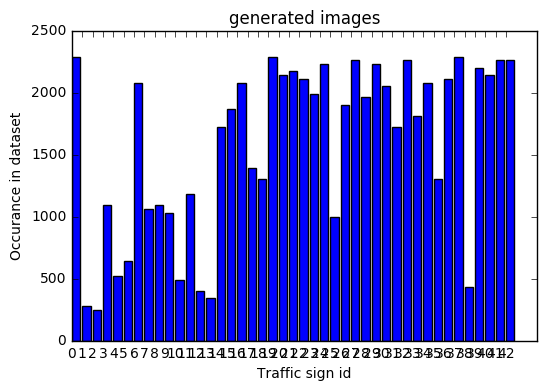

In [163]:
display_distribution(aug_x,aug_y,"generated images");

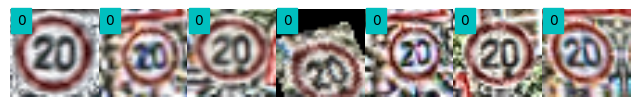

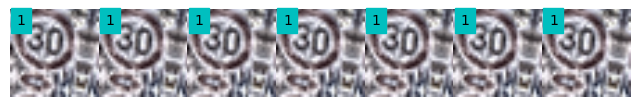

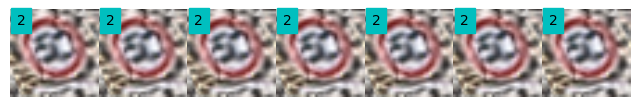

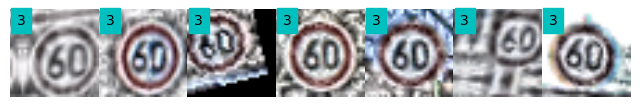

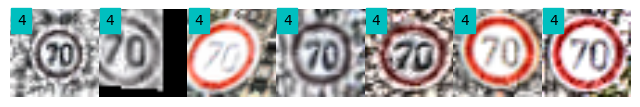

...

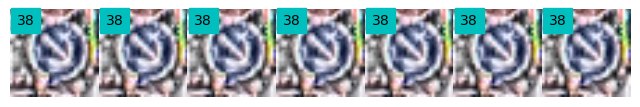

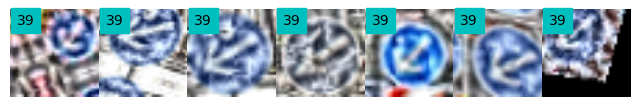

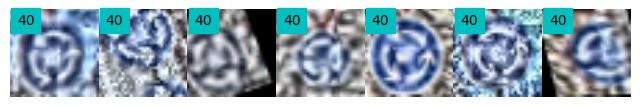

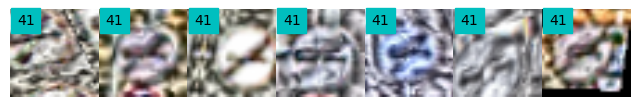

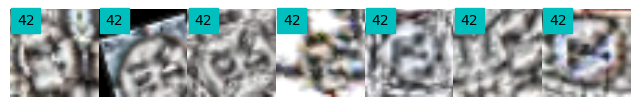

In [158]:
# Augmented images
for i in range(43):
    diaply_images_by_class(class_id=i,cols=7,rows=1,images=aug_x,labels=aug_y)

___
### Question 1 

_Describe how you preprocessed the data. Why did you choose that technique?_

**Answer:**

Colour images are used to train the network. The images are normalised to have values between (-.5 to +.5) and histogram normalised using open opencv.
* The images in the training set had different brightness and contrast across the dataset. Applying histogram normalisation will improve the low contrast images by distributing the intensity globally. This process helps bring out the features in dull images. 
* The images are normalised from (-.5 to +.5). Usually, the data set is normalised because the range of the features might be different eg: decent- age (0-120), distance (0,100000)km. So when using gradient descent to optimise, it makes hard to use a constant learning rate across all features. Normalising all features facilitates the use of the same learning rate. When using activation functions like sigmoid large values would easily saturate the network. 
* For images the pixel values are between 0 - 255. So normalising the images might not be as useful as it can be when dealing with features of different ranges. 

In [22]:
def normalise_range(images):
    images =  images/255;
    images -= .5;
    return images;

In [23]:
train,test = load_default_datasets()
src_x = train['features'];
src_y = train['labels'];

for i in range(len(src_x)):
    src_x[i] = preprocess_image(src_x[i])

full_set_x = np.concatenate((src_x,aug_x))
full_set_y = np.concatenate((src_y,aug_y))

X_test = test['features']
y_test = test['labels']
full_set_x = normalise_range(full_set_x)

for i in range(len(X_test)):
    X_test[i] = preprocess_image(X_test[i])
    
X_test = normalise_range(X_test)

In [24]:
print("Original train + vlaidation mean,min,max")
print(np.mean(train['features']),np.min(train['features']),np.max(train['features']) )
print("Augmented train + vlaidation mean,min,max")
print(np.mean(full_set_x),np.min(full_set_x),np.max(full_set_x) )
print("Test set mean,min,max")
print(np.mean(X_test),np.min(X_test),np.max(X_test) )

Original train + vlaidation mean,min,max
173.290754131 0 255
Augmented train + vlaidation mean,min,max
0.163228416066 -0.5 0.5
Test set mean,min,max
0.181141578765 -0.5 0.5


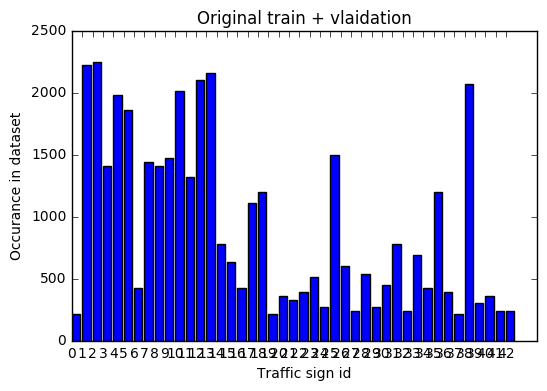

In [85]:
display_distribution(train['features'],train['labels'],"Original train + vlaidation");

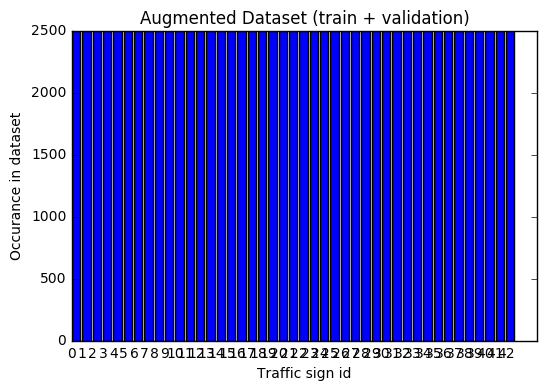

In [37]:
display_distribution(full_set_x,full_set_y,"Augmented Dataset (train + validation)");

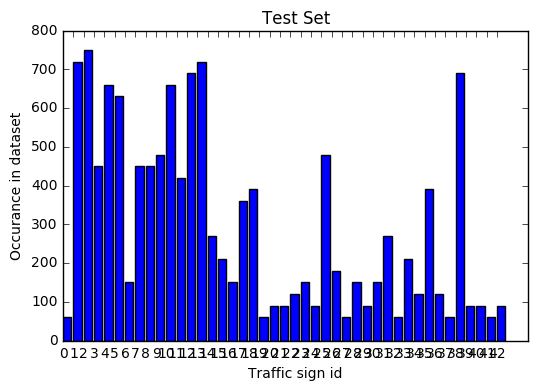

In [38]:
display_distribution(X_test,y_test,"Test Set");

In [25]:
X_train,X_validation,y_train,y_validation = train_test_split(full_set_x,full_set_y,test_size=0.2, random_state=0)

In [26]:
X_train, y_train = shuffle(X_train, y_train)
X_validation,y_validation = shuffle(X_validation,y_validation)

In [27]:
dump_dataset_sizes()

X train shape (86000, 32, 32, 3)
X valid shape (21500, 32, 32, 3)
X test  shape (12630, 32, 32, 3)
Y train shape (86000,)
y valid shape (21500,)
y test  shape (12630,)


### Question 2

_Describe how you set up the training, validation and testing data for your model. **Optional**: If you generated additional data, how did you generate the data? Why did you generate the data? What are the differences in the new dataset (with generated data) from the original dataset?_

**Answer:**

As it was seen earlier, there is a class imbalance in the training data set. The data set is augmented to produce more images to compensate for the class imbalance. The following transformations are applied to the training set to create a more balanced dataset. 
    
_Implented transformations_    
    * Crop   ---- crop images by 0-10% of their height/width
    * translate - translate by -8 to +8 pixels (per axis)
    * rotate ---- rotate by -20 to +20 degrees
    * shear  ---- shear by -16 to +16 degrees
    
The above transformations could be applied to any image and the resulting image will belong to the same class. With some extra effort, a more robust augmented dataset can be created if we can assign the resulting image to different classes. Eg: - flipping a turn right sign would generate a  left turn sign.

The augmented dataset is created by choosing a random (uniform distribution) image from the training dataset and augmenting it to such that each class consists of 2500 images. 

_other transformation ideas_
    * flip images 
    * dropout regions of images
    * scale images

The augmented dataset consists of 2500 images for every class. The augmented dataset is split into training and validation set. The original test is retained as the test set. 


### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


### Architecture

    * Layer 1: Convolutional ---| Input = 32x32x3    | Filter = 5x5x6    | Output = 28x28x6   |
    * ReLu Activation ----------|                    |                   |                    |
    * Layer 2: Convolutional ---| Input = 28x28x6    | Filter = 5x5x64   | Output = 24x24x64  |
    * ReLu Activation ----------|                    |                   |                    |
    * Max Pool -----------------| Input = 24x24x64   | Filter = 2x2x1    | Output = 12x12x64  |
    * ReLu Activation ----------|                    |                   |                    |
    * Layer 3: Convolutional ---| Input = 12x12x64   | Filter = 3x3x128  | Output = 10x10x128 |
    * ReLu Activation ----------|                    |                   |                    |
    * Max Pool -----------------| Input = 10x10x128  | Filter = 2x2x1    | Output = 5x5x128   |
    * FULLY CONNECTED ----------| Input = 3200       |                   | Output = 800       |
    * ReLu Activation ----------|                    |                   |                    |
    * Dropout ------------------|                    |                   |                    |
    * FULLY CONNECTED ----------| Input = 800        |                   | Output = 256       |
    * ReLu Activation ----------|                    |                   |                    |
    * Dropout ------------------|                    |                   |                    |
    * FULLY CONNECTED ----------| Input = 256        |                   | Output = 84        |
    * ReLu Activation ----------|                    |                   |                    |
    * Dropout ------------------|                    |                   |                    |
    * FULLY CONNECTED ----------| Input = 84         |                   | Output = 43        |

    



**Answer:**

In [42]:
import tensorflow as tf

EPOCHS = 20
BATCH_SIZE = 128

### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


**Answer:**

The following setting was used to train the model

   * epochs = 40
   * batch size = 128
   * Dropout - keep probability of 0.75
   * Adam Optimizer with learning rate of 0.0005

This was the most time-consuming task of all. It would be best to search for optimal hyperparameters on a cluster of machines with different settings.

__Learnign rate:__
 I have tried different learning rate from (.0001 to .009). Having a large learning rate sometimes just reaches local minima around .76% accuracy. 

__Epocs:__ 
 The introduction of dropout required increasing the number of epochs for the solution to converge. Because dropout forces the system to learn different representations.  

In [29]:
from tensorflow.contrib.layers import flatten

def LeNet(x):    
    # Arguments used for tf.truncated_normal, randomly defines variables for the weights and biases for each layer
    mu = 0
    sigma = 0.1
    
    # Layer 1: Convolutional. Input = 32x32x3. Output = 28x28x6.
    conv1_weights = tf.Variable(tf.truncated_normal([5,5,3,6],mean=mu, stddev=sigma)) 
    conv1_bias    = tf.Variable(tf.zeros(6)) 
    conv1         = tf.nn.conv2d(input=x,filter=conv1_weights,strides=[1,1,1,1],padding='VALID') + conv1_bias
    
    # Activation.
    conv1_activation = tf.nn.relu(conv1)
    
    # Layer 2: Convolutional. Output = 24x24x64.
    conv2_weights = tf.Variable(tf.truncated_normal([5,5,6,64],mean=mu, stddev=sigma)) 
    conv2_bias    = tf.Variable(tf.zeros(64)) 
    conv2         = tf.nn.conv2d(input=conv1_activation,filter=conv2_weights,strides=[1,1,1,1],padding='VALID') + conv2_bias
    
    
    # Activation.
    conv2_activation = tf.nn.relu(conv2)

    # TODO: Pooling. Input = 24x24x64. Output = 12x12x64.
    m_pool1 = tf.nn.max_pool(conv2_activation,ksize=[1,2,2,1],strides=[1,2,2,1],padding='VALID')

    # Layer 2: Convolutional. Output = 10x10x128.
    conv3_weights = tf.Variable(tf.truncated_normal([3,3,64,128],mean=mu, stddev=sigma)) 
    conv3_bias    = tf.Variable(tf.zeros(128)) 
    conv3         = tf.nn.conv2d(input=m_pool1,filter=conv3_weights,strides=[1,1,1,1],padding='VALID') + conv3_bias
    
    
    # Activation.
    conv3_activation = tf.nn.relu(conv3)

    # Pooling. Input = 10x10x128. Output = 5x5x128.
    m_pool2 = tf.nn.max_pool(conv3_activation,ksize=[1,2,2,1],strides=[1,2,2,1],padding='VALID')
    
    # Flatten. Input = 5x5x16. Output = 400.
    flat1 = flatten(m_pool2)
    
    # Layer 3: Fully Connected. Input = 3200. Output = 800.
    fc1_weights =  tf.Variable(tf.truncated_normal([3200,800],mean=mu, stddev=sigma))
    fc1_bias    =  tf.Variable(tf.zeros(800))
    fc1         =  tf.matmul(flat1,fc1_weights) + fc1_bias

    # Activation.
    fc1_activation = tf.nn.relu(fc1)
    drop1 = tf.nn.dropout(fc1_activation,keep_prob)
    
    # Layer 4: Fully Connected. Input = 800. Output = 256.
    fc2_weights =  tf.Variable(tf.truncated_normal([800,256],mean=mu, stddev=sigma))
    fc2_bias    =  tf.Variable(tf.zeros(256))
    fc2         =  tf.matmul(drop1,fc2_weights) + fc2_bias
    
    # Activation.
    fc2_activation = tf.nn.relu(fc2)
    drop2 = tf.nn.dropout(fc2_activation,keep_prob)
 
    # Layer 5: Fully Connected. Input = 256. Output = 84.
    fc3_weights =  tf.Variable(tf.truncated_normal([256,84],mean=mu, stddev=sigma))
    fc3_bias    =  tf.Variable(tf.zeros(84))
    fc3         =  tf.matmul(fc2_activation,fc3_weights) + fc3_bias
    
    fc3_activation = tf.nn.relu(fc3)
    drop3 = tf.nn.dropout(fc3_activation,keep_prob)
    
    # Layer 5: Fully Connected. Input = 84. Output = 10.
    fc4_weights =  tf.Variable(tf.truncated_normal([84,43],mean=mu, stddev=sigma))
    fc4_bias    =  tf.Variable(tf.zeros(43))
    fc4        =  tf.matmul(drop3,fc4_weights) + fc4_bias
    logits = fc4
    
    return logits

In [37]:
x = tf.placeholder(tf.float32, (None, 32, 32, 3))
y = tf.placeholder(tf.int32, (None))
keep_prob = tf.placeholder(tf.float32) # probability to keep units
one_hot_y = tf.one_hot(y, 43)

In [38]:
rate = 0.0005

logits = LeNet(x)
cross_entropy = tf.nn.softmax_cross_entropy_with_logits(logits, one_hot_y)
loss_operation = tf.reduce_mean(cross_entropy)
optimizer = tf.train.AdamOptimizer(learning_rate = rate)
training_operation = optimizer.minimize(loss_operation)

In [39]:
correct_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(one_hot_y, 1))
accuracy_operation = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
saver = tf.train.Saver()

def evaluate(X_data, y_data):
    num_examples = len(X_data)
    total_accuracy = 0
    sess = tf.get_default_session()
    for offset in range(0, num_examples, BATCH_SIZE):
        batch_x, batch_y = X_data[offset:offset+BATCH_SIZE], y_data[offset:offset+BATCH_SIZE]
        accuracy = sess.run(accuracy_operation, feed_dict={x: batch_x, y: batch_y, keep_prob:1.0})
        total_accuracy += (accuracy * len(batch_x))
    return total_accuracy / num_examples

In [43]:
data = {
    'epoc':[],
    'valid_accuracy':[],
    'test_accuracy':[]
}

with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    num_examples = len(X_train)
    
    print("Training...")
    print()
    for i in range(EPOCHS):
        X_train, y_train = shuffle(X_train, y_train)
        for offset in range(0, num_examples, BATCH_SIZE):
            end = offset + BATCH_SIZE
            batch_x, batch_y = X_train[offset:end], y_train[offset:end]
            sess.run(training_operation, feed_dict={x: batch_x, y: batch_y, keep_prob:.75})
            
        validation_accuracy = evaluate(X_validation, y_validation)
        data['epoc'].append(i)
        data['valid_accuracy'].append(validation_accuracy)
        print("EPOCH {} ...".format(i+1))
        print("Validation Accuracy = {:.3f}".format(validation_accuracy))
        print()
        
    saver.save(sess, 'lenet')
    create_pickle(data=data,file_path="./validation_accuracy.p")
    print("Model saved")

Training...

EPOCH 1 ...
Validation Accuracy = 0.774

EPOCH 2 ...
Validation Accuracy = 0.837

EPOCH 3 ...
Validation Accuracy = 0.885

EPOCH 4 ...
Validation Accuracy = 0.906

EPOCH 5 ...
Validation Accuracy = 0.926

EPOCH 6 ...
Validation Accuracy = 0.932

EPOCH 7 ...
Validation Accuracy = 0.941

EPOCH 8 ...
Validation Accuracy = 0.943

EPOCH 9 ...
Validation Accuracy = 0.946

EPOCH 10 ...
Validation Accuracy = 0.949

EPOCH 11 ...
Validation Accuracy = 0.947

EPOCH 12 ...
Validation Accuracy = 0.949

EPOCH 13 ...
Validation Accuracy = 0.952

EPOCH 14 ...
Validation Accuracy = 0.950

EPOCH 15 ...
Validation Accuracy = 0.955

EPOCH 16 ...
Validation Accuracy = 0.954

EPOCH 17 ...
Validation Accuracy = 0.954

EPOCH 18 ...
Validation Accuracy = 0.952

EPOCH 19 ...
Validation Accuracy = 0.958

EPOCH 20 ...
Validation Accuracy = 0.960

Data saved in ./validation_accuracy.p
Model saved


In [44]:
data = load_pickle("./validation_accuracy.p")

In [45]:
print("Validation accuracy ", data['valid_accuracy'][-1])

Validation accuracy  0.959860465083


### Validation acuuracy

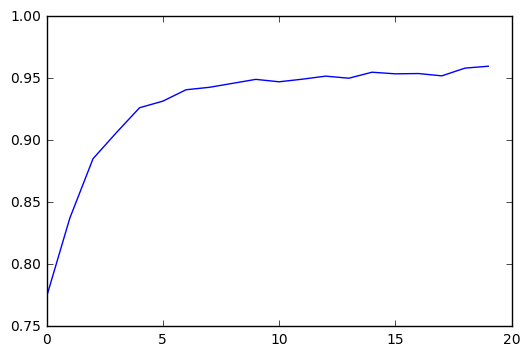

In [46]:
plot = plt.plot(data['epoc'],data['valid_accuracy'])

### Question 5


_What approach did you take in coming up with a solution to this problem? It may have been a process of trial and error, in which case, outline the steps you took to get to the final solution and why you chose those steps. Perhaps your solution involved an already well known implementation or architecture. In this case, discuss why you think this is suitable for the current problem._

**Answer:**

The architecture is an extension of the Lenet architecture with more layers and dropout to facilitate learning different representations. I was not able to achieve accuracy out of the lenet architecture for the augmented dataset. My conclusion was that the size and depth of the network were shallow and did not have to capacity to represent or capture features. Adding more layers to the network improved the accuracy.

I could have just implemented the [sermanet's paper](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It would have provided even better accuracy. I wanted to understand the relationship between the depth and size of the network to its performance and the importance of hyperparameter tuning. So I ended just experimenting architecture based with lenet as the base.

The architecture implemented is not optimal. Architecture smaller than this has provided equal or better results.


## Evaluate the Model on Test Set


In [47]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))

    test_accuracy = evaluate(X_test, y_test)
    print("Test Accuracy = {:.3f}".format(test_accuracy))

Test Accuracy = 0.970


---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [48]:
def get_image_from_class(class_id):
    rnd_img_idx_by_class = np.random.choice(np.where( train['labels'] == class_id )[0])
    image = train['features'][rnd_img_idx_by_class]
    return image;

In [49]:
def top_k_predictions(images, k = 5):
    with tf.Session() as sess:
        saver.restore(sess, tf.train.latest_checkpoint('.'))
        softamx = tf.nn.softmax(logits)
        
        top_k   = tf.nn.top_k(softamx,k)
        top_k_predictions = sess.run(top_k, feed_dict={x: images,keep_prob:1})
        return top_k_predictions;
    
    

In [50]:
def display_top_k(input,predicted,predictions, index):
    
    pyplot.figure(figsize = (6, 2))
    gridspec.GridSpec(2, 2)
    
    #input image
    pyplot.subplot2grid((2, 2), (0, 0), colspan=1, rowspan=1)
    pyplot.imshow(original)
    pyplot.axis('off')

    # predicted image
    pyplot.subplot2grid((2, 2), (1, 0), colspan=1, rowspan=1)
    pyplot.imshow(preprocessed, cmap='gray')
    pyplot.axis('off')

    # predictions
    pyplot.subplot2grid((2, 2), (0, 1), colspan=1, rowspan=2)
    pyplot.barh(np.arange(5)+.5, predictions[0][index], align='center')
    pyplot.yticks(np.arange(5)+.5, signnames[predictions[1][index].astype(int)])
    pyplot.tick_params(axis='both', which='both', labelleft='off', labelright='on', labeltop='off', labelbottom='off')
    
    pyplot.show()

In [51]:
def top_k_for_random_test_img():
    test_image = test['features'][np.random.choice(np.arange(len(X_test)))];
    top_k = top_k_predictions([test_image],k=5)
    top_k_class = top_k[1][0].squeeze();

    gs1 = gridspec.GridSpec(1,6)
    gs1.update(wspace=0.01, hspace=0.02) # set the spacing between axes.
    plt.figure(figsize=(12,12))
    ax1 = plt.subplot(gs1[0])
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    ax1.set_aspect('equal')
    ax1.set_title("Input")

    plt.imshow(test_image);

    for i in range(len(top_k_class)):
        ax1 = plt.subplot(gs1[i+1])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')
        ax1.set_title(top_k_class[i])
        plt.imshow(get_image_from_class(top_k_class[i]))
        plt.axis('off')
    plt.show()


### Display top five predictions for a random image in the test set.

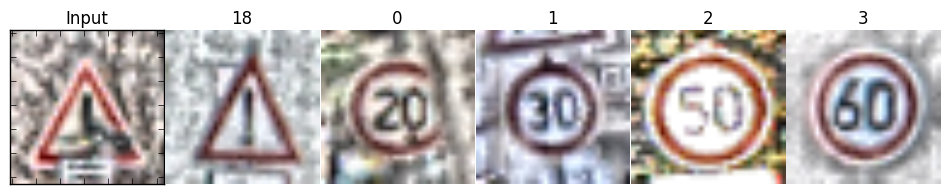

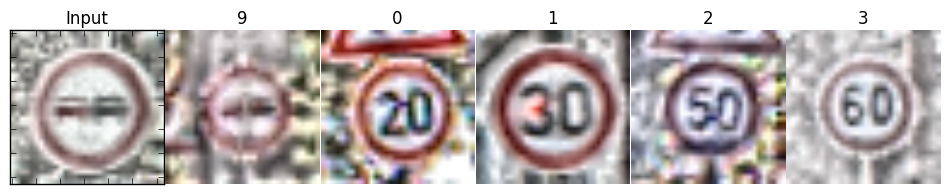

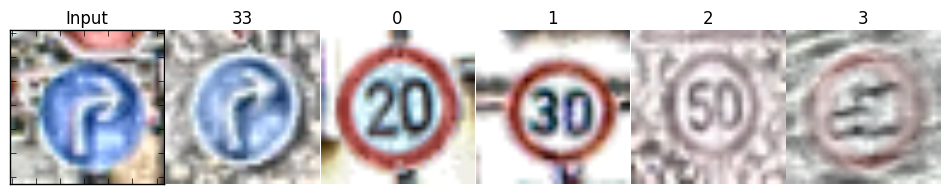

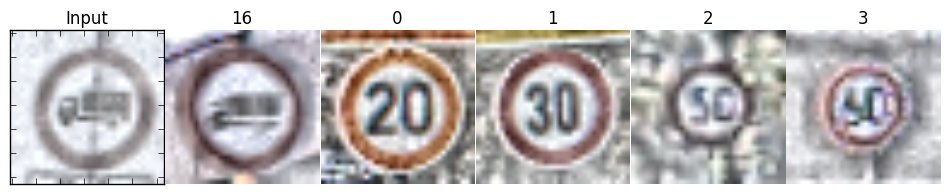

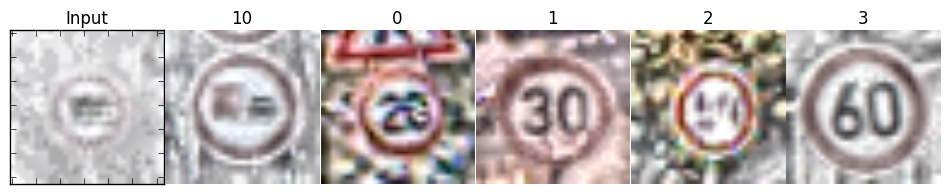

In [52]:
for i in range(5):
    top_k_for_random_test_img()

In [53]:
def display_predictions(input_image,predicted_image,input_class,predicted_class,top_k_prob,top_k_class):
        prob_index = 0
        print("prob ", top_k_prob )
        print("outp ", top_k_class)
        gs1 = gridspec.GridSpec(2,2)
        gs1.update(wspace=.5, hspace=.5)
        plt.figure(figsize=(5,5))
        ax1 = plt.subplot(gs1[0])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')
        if input_class is not -1:
            ax1.set_title(str("input-" + sign_names[input_class]))
        plt.imshow(input_image.squeeze(),cmap="gray");
        plt.text(2,5,
                     str(input_class),
                     color='k',
                     backgroundcolor='c')

        ax1 = plt.subplot(gs1[1,0])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')
        ax1.set_title(str("prediction-" + sign_names[predicted_class]) )
        plt.imshow(predicted_image.squeeze());
        plt.text(2,5,
                     str(predicted_class),
                     color='k',
                     backgroundcolor='c')
        
        ax1 = plt.subplot(gs1[:,1])
        
        plt.barh(len(top_k_prob)+1 - np.arange(len(top_k_prob)),top_k_prob, align='center')
        
        for label_idx in range(5):
            plt.text(top_k_prob[label_idx]+.02,6-label_idx-.25,
            sign_names[top_k_class[label_idx]])
        
        plt.axis('off');
        plt.show();

### Display incorrect predictions in the test set

Number of wrong predictions  82
prob  [ 0.48717004  0.14781538  0.12481643  0.1048997   0.06805634]
outp  [24 26 18 21 27]


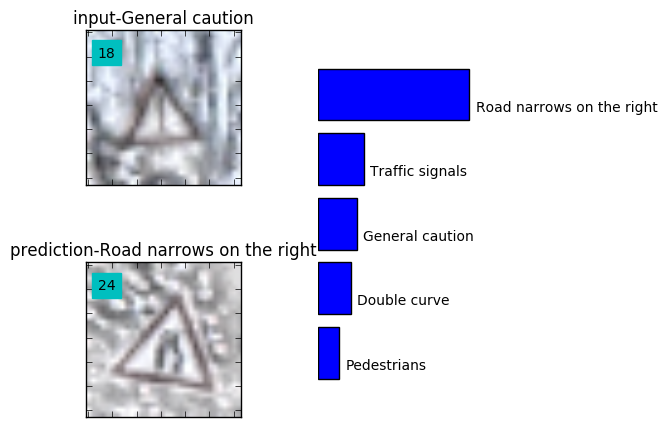

prob  [ 0.80678129  0.16121283  0.01989748  0.00768257  0.00235437]
outp  [31 25 12 21 39]


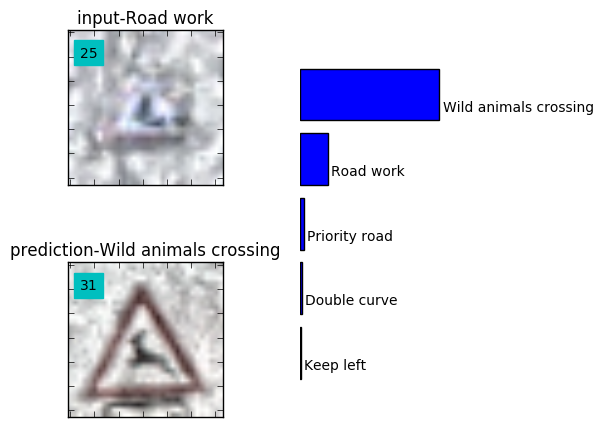

prob  [  9.97281909e-01   2.70034093e-03   1.76679205e-05   3.14622461e-09
   1.70945713e-09]
outp  [ 5  1  2  3 15]


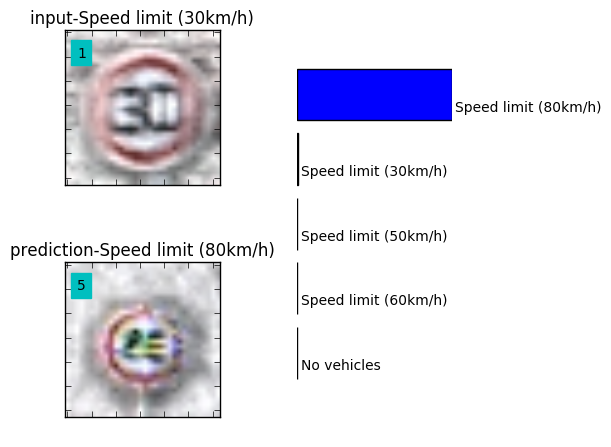

Number of wrong predictions  101
prob  [  6.99877024e-01   2.99911886e-01   1.63544129e-04   3.62555038e-05
   1.04401706e-05]
outp  [23 30 11 20 21]


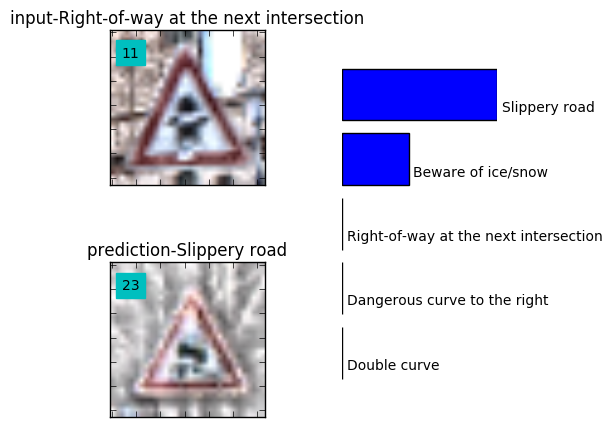

prob  [  8.87345135e-01   1.12607747e-01   3.79327284e-05   6.37505582e-06
   1.66202267e-06]
outp  [11 25 21 30 31]


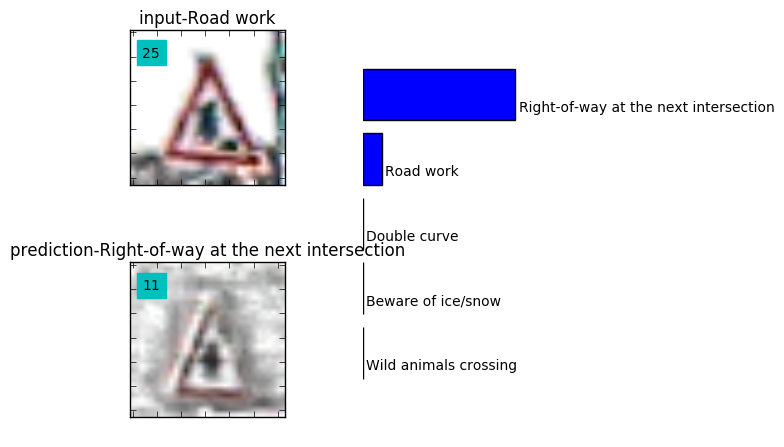

prob  [ 0.59709311  0.20656215  0.10950722  0.03102405  0.02032919]
outp  [34  8 23  5 30]


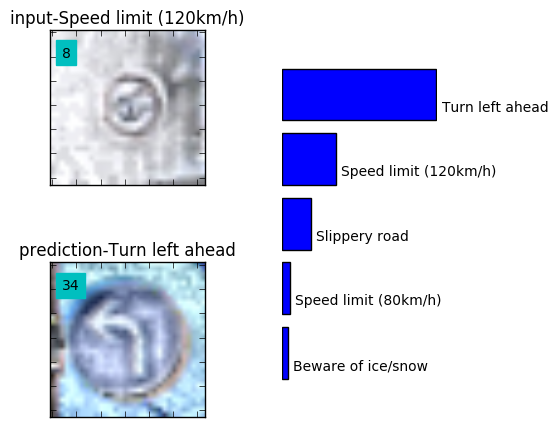

Number of wrong predictions  94
prob  [ 0.5026772   0.34459451  0.12324151  0.026477    0.001686  ]
outp  [20 30 11 25 26]


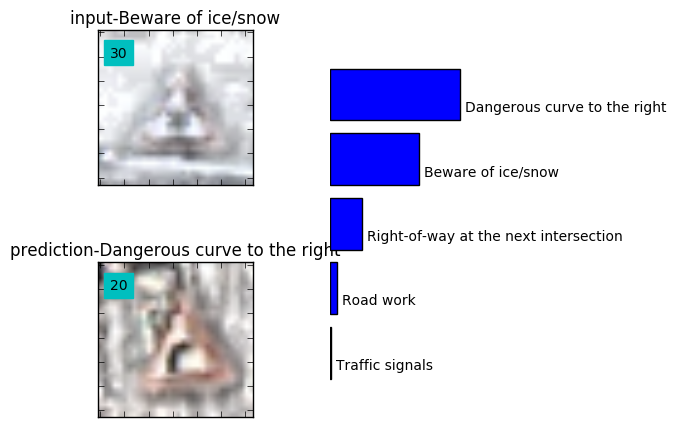

prob  [ 0.71043462  0.18282647  0.05695184  0.02725047  0.01060359]
outp  [15  9 12 41 32]


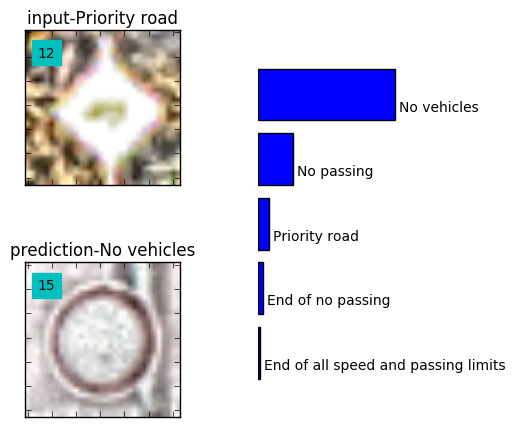

prob  [ 0.37764993  0.25497013  0.10883435  0.07077071  0.06424531]
outp  [ 8  6 16 42 20]


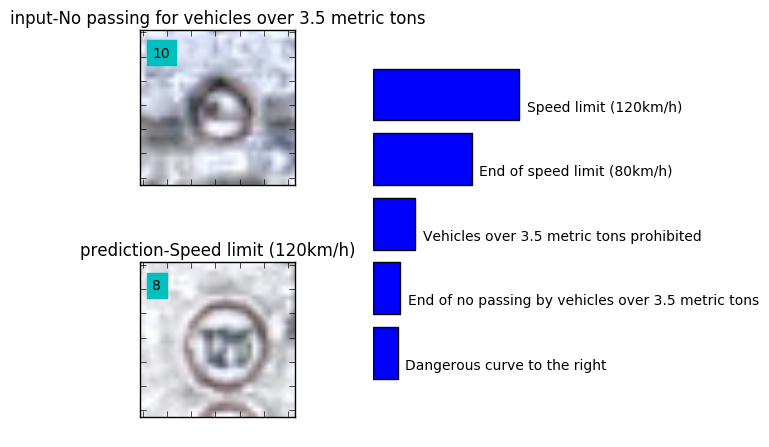

Number of wrong predictions  81
prob  [ 0.45738682  0.33545986  0.19609195  0.00853179  0.00143485]
outp  [24 18 27 28 25]


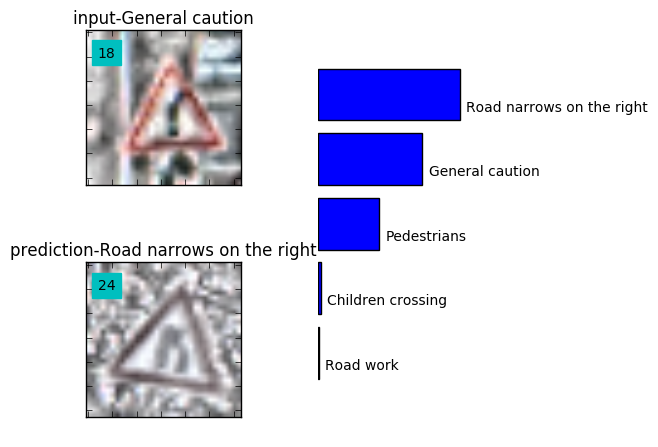

prob  [ 0.54970545  0.39239529  0.03738469  0.01744449  0.0021107 ]
outp  [ 7  4  8  5 15]


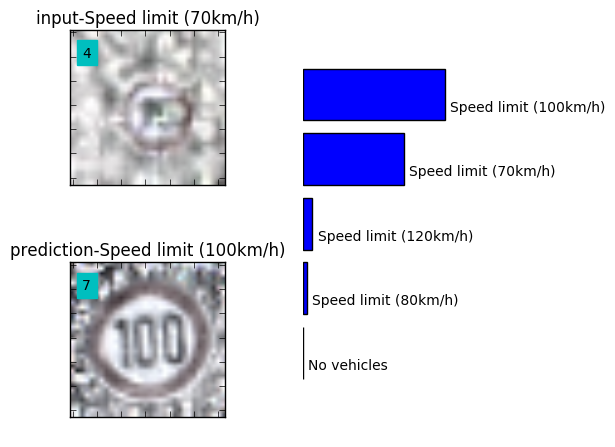

prob  [ 0.88380784  0.08558086  0.00911197  0.0057781   0.00399747]
outp  [ 8 15 22 40 29]


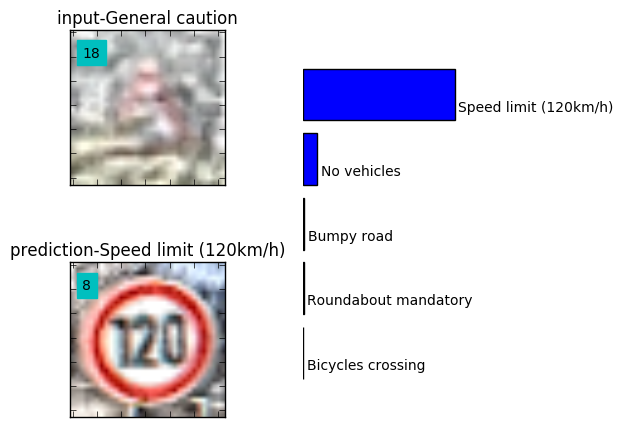

Number of wrong predictions  26
prob  [  9.99837637e-01   1.62172670e-04   1.54703812e-07   2.19373053e-09
   5.42439760e-10]
outp  [25 22 26 20 31]


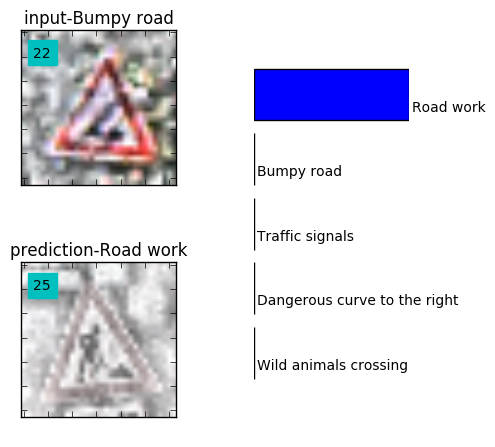

prob  [  9.50561345e-01   4.34134342e-02   5.67084225e-03   3.49452719e-04
   3.29392151e-06]
outp  [23 29 20 22 30]


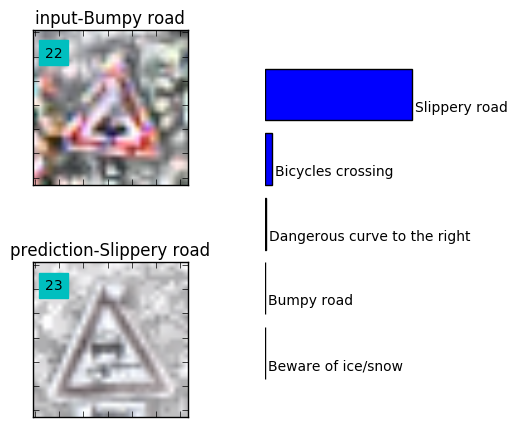

prob  [  7.47497797e-01   2.49213353e-01   1.94241107e-03   1.34462689e-03
   1.49179289e-06]
outp  [25 26 11 30 20]


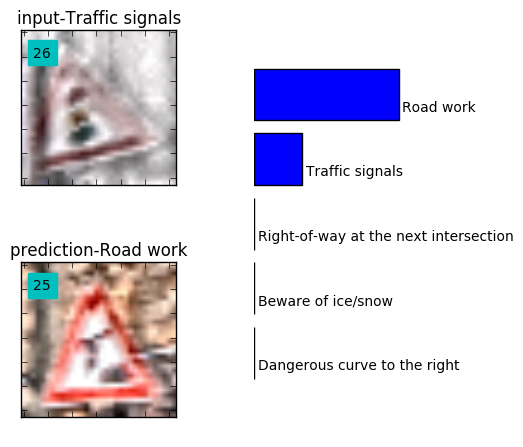

In [54]:
# find the images with 
num_examples = len(X_test)
TEST_BATCH = 3000;
for offset in range(0, num_examples, TEST_BATCH):
    end = offset + TEST_BATCH
    batch_x, batch_y = X_test[offset:end], y_test[offset:end]
    batch_x_src      = test['features'][offset:end] # un normlised image
    top_k = top_k_predictions(batch_x,k=5)
    predictions = top_k[1][:,[0]].squeeze()
    wrong_predicitons_img_class = batch_y[batch_y != predictions]   # input expected classes but predicted incorrectly.
    wrong_predicitons_img = batch_x_src[batch_y != predictions]     # input images predicted incorrectly (input to model)
    wrong_predicitons = predictions[batch_y != predictions]         # image class predicted. (output from mode)
    top_k_probs = top_k[0][batch_y != predictions]
    top_k_classes = top_k[1][batch_y != predictions]
    
    print("Number of wrong predictions ", len(wrong_predicitons))
    for i in range(0,len(wrong_predicitons)):
        input_img = wrong_predicitons_img[i].squeeze();
        input_img_class = wrong_predicitons_img_class[i];
        predicted_img = get_image_from_class(wrong_predicitons[i])
        predicted_class = wrong_predicitons[i];
        
        top_k_prob = top_k_probs[i];
        top_k_class = top_k_classes[i];
        
        display_predictions(input_img,predicted_img,input_img_class,predicted_class,top_k_prob,top_k_class)
        if(i == 2):
            break;



The above images are some of the incorrectly predicted from the test set. It can be seen that the incorrectly predicted images are very dark and do contain a lot of artifacts.

### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It could be helpful to plot the images in the notebook._



__Answer__

__External german traffic signs__

Loaded external dataset  (13, 32, 32, 3) (13,)


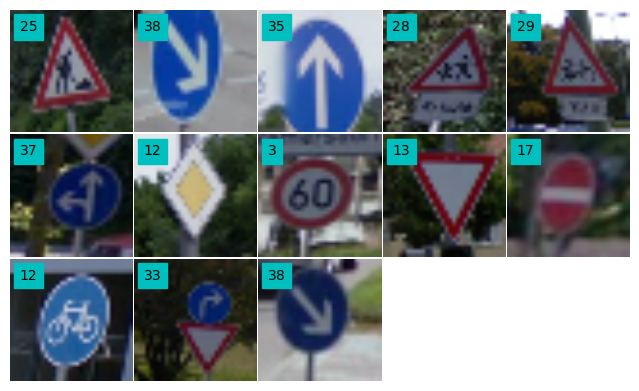

In [82]:
usa_dir = "./german_external/"
image_paths = os.listdir(usa_dir)
external_img = []
# assigned class for the external images.
external_img_class = {
	"00":13,
	"01":38,
	"02":35,
	"03":12,
	"04":3,
	"05":28,
	"06":29,
	"07":33,
	"08":25,
	"09":12,
	"10":37,
	"11":17,
	"12":38,
}
external_img_y = []
for file_name in image_paths:
    image = cv2.imread(usa_dir + file_name)
    image = cv2.resize(image,(32,32))
    
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    external_img.append(image)
    external_img_y.append(external_img_class[file_name.split('.')[0]])

external_img   = np.array(external_img)
external_img_y = np.array(external_img_y)
print("Loaded external dataset ", external_img.shape, external_img_y.shape );
diaply_all_images(5,5,external_img,external_img_y)

In [83]:
external_img_src = external_img

for i in range(len(external_img_src)):
    external_img[i] = preprocess_image(external_img_src[i])
    
external_img = normalise_range(external_img)


The above images are captured from google street view from german streets. Some of the images chosen are not in the training data set.
* Image with yield and turn right. - a good test to see given a balanced training set how the network is biased.
* a cylce sign - not in the source dataset.

### Question 7

_Is your model able to perform equally well on captured pictures when compared to testing on the dataset? The simplest way to do this check the accuracy of the predictions. For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate._

_**NOTE:** You could check the accuracy manually by using `signnames.csv` (same directory). This file has a mapping from the class id (0-42) to the corresponding sign name. So, you could take the class id the model outputs, lookup the name in `signnames.csv` and see if it matches the sign from the image._


__Answer__

In [84]:
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))

    test_accuracy = evaluate(external_img, external_img_y)
    print("External image Test Accuracy = {:.3f}".format(test_accuracy))

External image Test Accuracy = 0.846


* __Accuracy on test set    = 0.970__
* __Accuracy External image = 0.846__



The model performance is similar to the test set as long as the network has seen a similar image.

Here the sample size of the external set is really small (13 images) and the dataset contains one image which was not in the training set. I have assigned a similar looking class for the image not in the dataset. looking at the top five predictions will give us more insights about the network.

The accuracy of the external image set would have been better. But the external image dataset intentionally contains an image which does not belong to any of the original class and this brings the accuracy down.

Overall if the network has seen a simlar image it shoud be able to classify it.

prob  [ 0.93386149  0.03367223  0.02092703  0.00571049  0.00544473]
outp  [25 27 11 18 26]


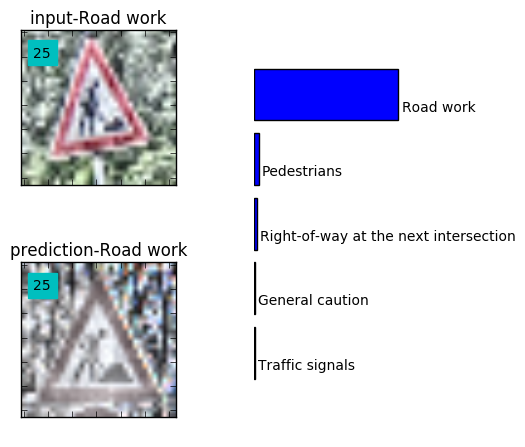

prob  [  9.99627590e-01   3.40322207e-04   1.62715387e-05   1.39924587e-05
   7.32540173e-07]
outp  [38 34 39 40 37]


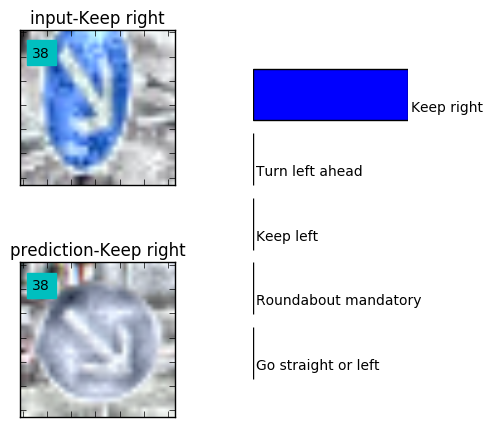

prob  [  1.00000000e+00   1.41746639e-19   4.97114610e-20   5.67965997e-25
   3.81027482e-27]
outp  [35 34 36 37 33]


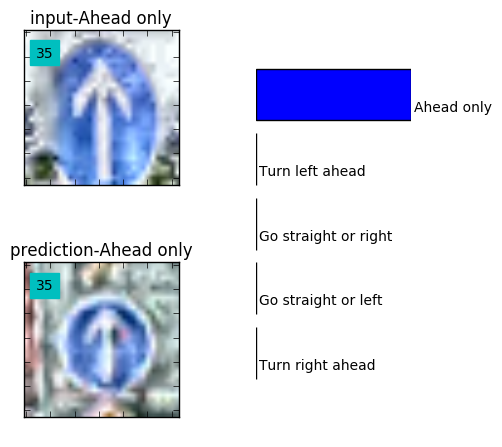

prob  [  7.59817839e-01   1.96313947e-01   4.30532172e-02   6.00947242e-04
   1.00681485e-04]
outp  [28 24  0  1 29]


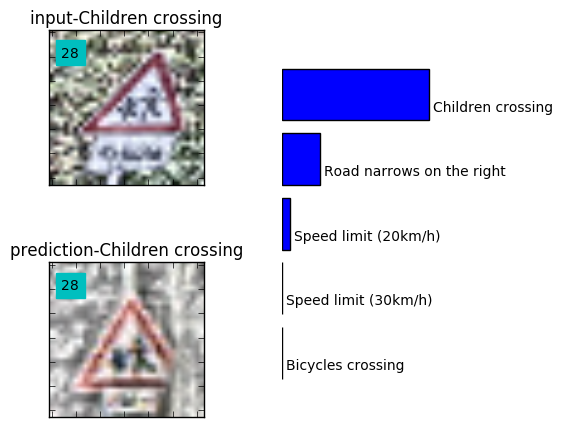

prob  [  9.78461862e-01   1.78898536e-02   3.50429700e-03   5.45675211e-05
   5.12177103e-05]
outp  [29 23 22 28 25]


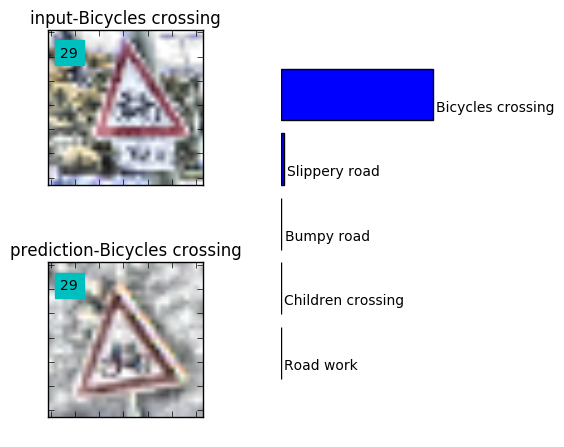

prob  [  8.34553361e-01   1.64295062e-01   8.97312653e-04   1.33444046e-04
   1.07061518e-04]
outp  [37 34 38 35 40]


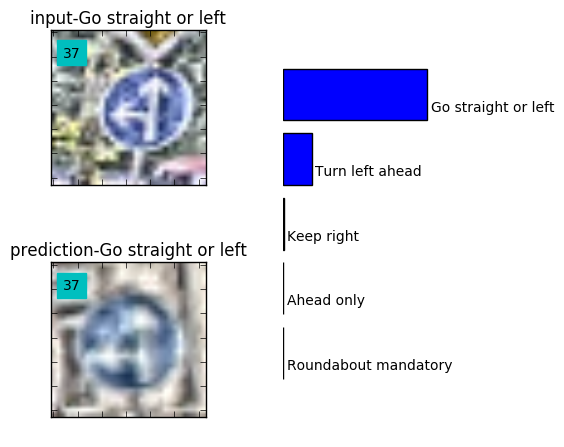

prob  [  1.00000000e+00   4.73119099e-10   8.48267151e-11   1.41004537e-12
   1.30235113e-12]
outp  [12 17 25 14 11]


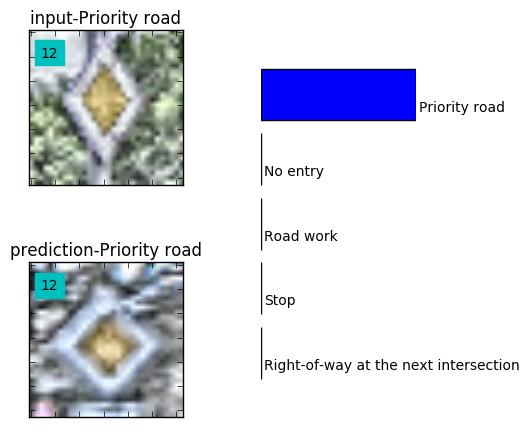

prob  [  9.97752964e-01   2.22302647e-03   1.71525335e-05   6.64774416e-06
   1.61066453e-07]
outp  [ 3  5  2  1 29]


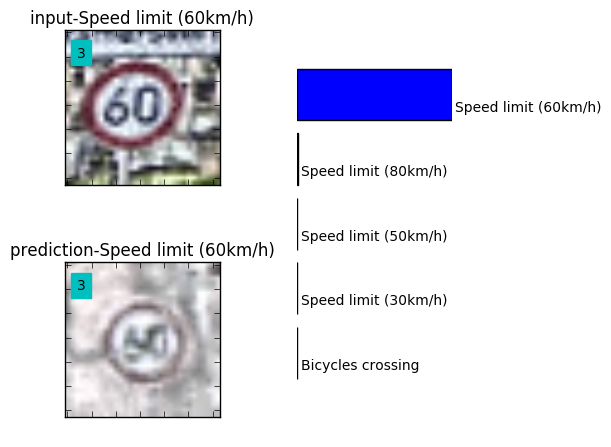

prob  [  1.00000000e+00   3.41319030e-12   9.68926003e-13   2.44303465e-13
   2.29045759e-13]
outp  [13 22 15 29 14]


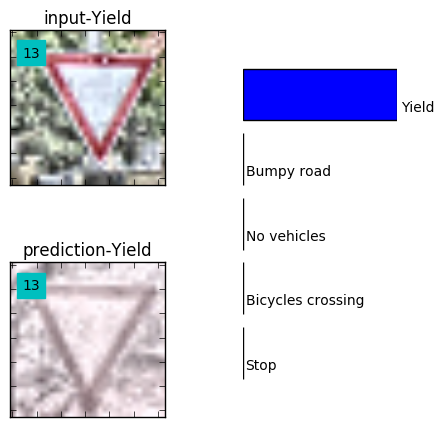

prob  [  1.00000000e+00   3.27356267e-11   1.94934971e-11   1.48216699e-11
   5.03817561e-12]
outp  [17 10 12 14 40]


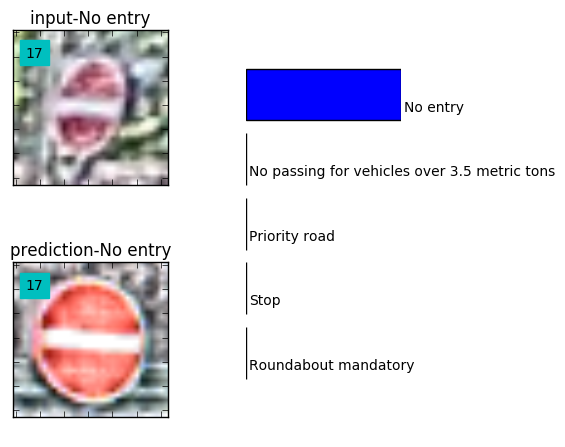

prob  [  9.99477684e-01   2.85921094e-04   1.09795219e-04   7.61832198e-05
   2.76001847e-05]
outp  [37 34 40 38 39]


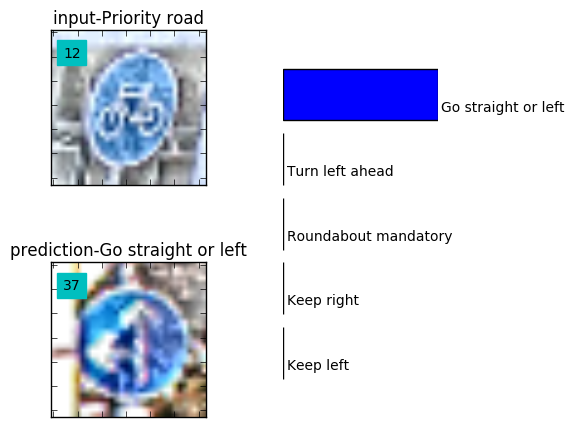

prob  [ 0.35758212  0.16480717  0.06160113  0.0543761   0.05219875]
outp  [40 39 38  9 37]


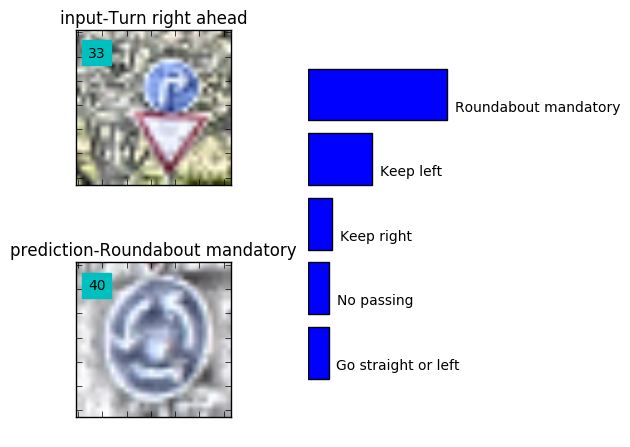

prob  [  1.00000000e+00   7.12738668e-09   2.09816942e-09   7.86060106e-11
   3.94880932e-13]
outp  [38 40 34 37 30]


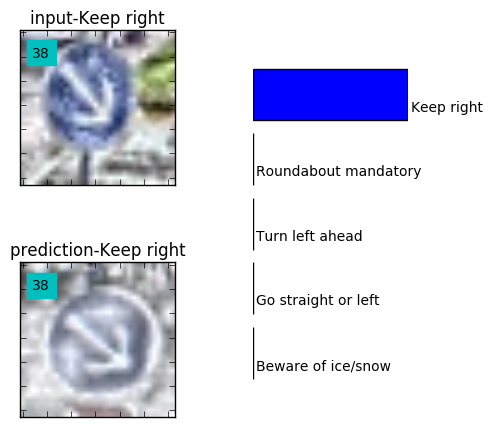

In [85]:
# top k for external german dataset. 
num_examples = len(external_img)
TEST_BATCH = 3000;
for offset in range(0, num_examples, TEST_BATCH):
    end = offset + TEST_BATCH
    batch_x = external_img[offset:end]
    top_k = top_k_predictions(batch_x,k=5)
    
    predictions = top_k[1][:,[0]].squeeze()
    for i in range(0,len(predictions)):
        input_img = external_img_src[i]
        input_img_class = external_img_y[i]  
        predicted_img = get_image_from_class(predictions[i])
        predicted_class = predictions[i]
        
        top_k_prob = top_k[0][i];
        top_k_class = top_k[1][i];
        
        display_predictions(input_img,predicted_img,input_img_class,predicted_class,top_k_prob,top_k_class)




### Testing with external datset - usa dataset.


Some of the signs here are from the american traffic signs and follow a completely differ color scheme with yellow background and Diamond shape.  The network is able to match best on the based on what it hase seen before.Below is the prediction of the network for the signs i collected. I wanted to see how the netwrok will perform with different set of images. some of the intresing outputs were,

* Traffic signs with a yellow diamond background. -> network is able to find the yellow diamond not the traffic sign.
* limit 60 sign on a yellow rectangular background. -> the prediction is totally off.



In [177]:

usa_dir = "./usa_data/"
image_paths = os.listdir(usa_dir)
external_img = []
for file_name in image_paths:
    image = cv2.imread(usa_dir + file_name)
    image = cv2.resize(image,(32,32))
    
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    external_img.append(image)

external_img = np.array(external_img)
print("Loaded external dataset ", external_img.shape );
    

Loaded external dataset  (10, 32, 32, 3)


In [178]:
external_img_src = external_img

for i in range(len(external_img_src)):
    external_img[i] = preprocess_image(external_img_src[i])
    
external_img = normalise_range(external_img)


prob  [  9.99999762e-01   2.45243257e-07   3.96838118e-08   8.02122202e-10
   2.42966723e-11]
outp  [12 26 11 30  5]


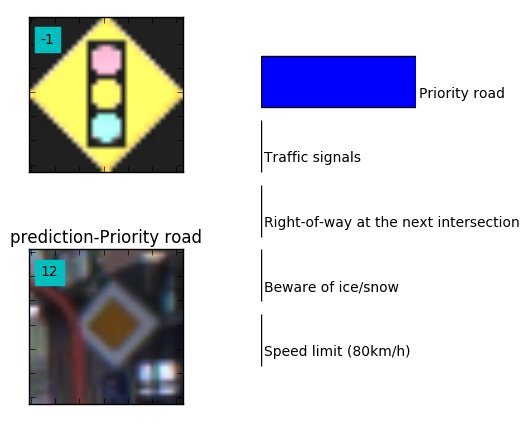

prob  [  9.68015373e-01   2.42197551e-02   7.29015702e-03   2.99265899e-04
   8.74648103e-05]
outp  [11 26  1 30 32]


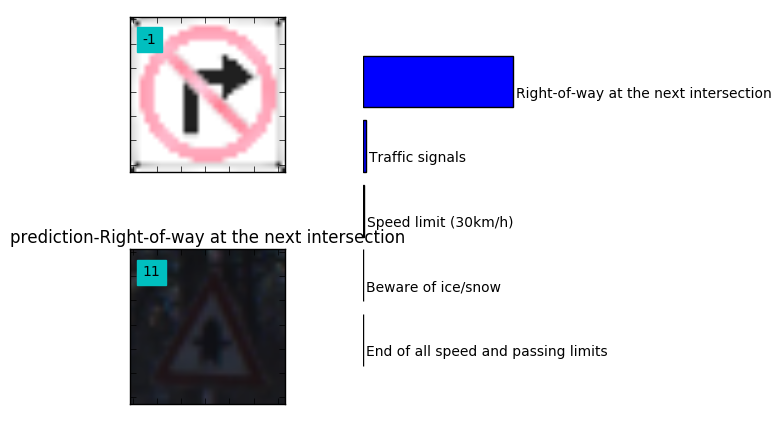

prob  [  1.00000000e+00   1.78084985e-16   3.99135811e-24   7.55719503e-28
   1.62927859e-28]
outp  [18 26 27 31 14]


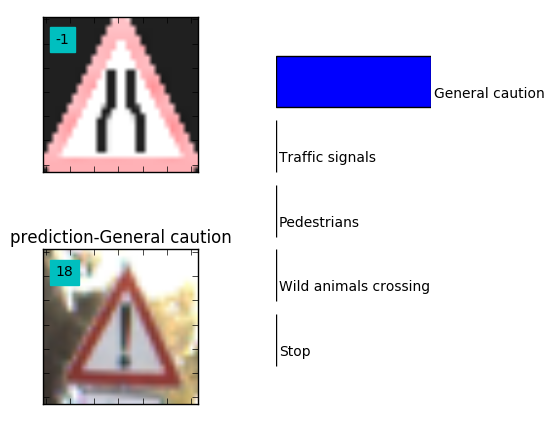

prob  [  9.92904961e-01   5.13369869e-03   1.90096709e-03   4.59797811e-05
   1.41893288e-05]
outp  [28 29  3 22 14]


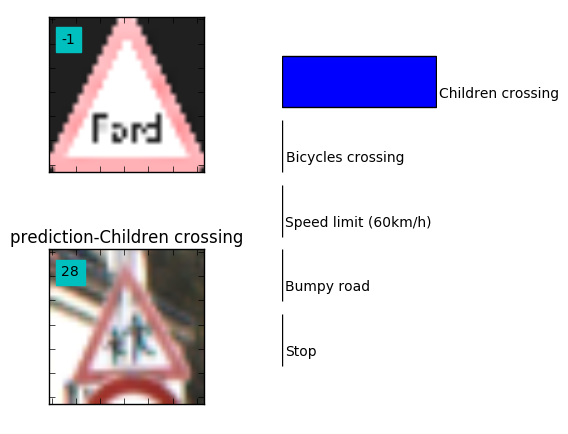

prob  [  9.99998689e-01   1.35596110e-06   2.82831376e-12   6.45591707e-14
   2.31653330e-14]
outp  [12 26 18 11 13]


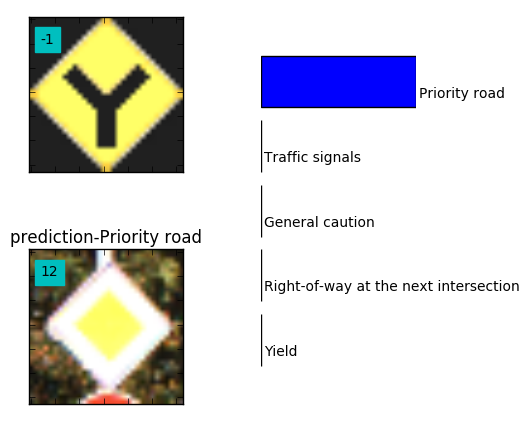

prob  [  9.60639119e-01   3.93548086e-02   4.73762066e-06   1.41142039e-06
   3.60740309e-08]
outp  [26 12 11  5 18]


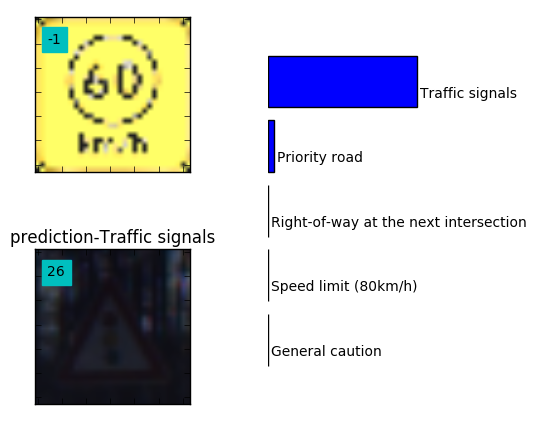

prob  [  1.00000000e+00   3.87700463e-18   2.86421441e-18   1.02897081e-18
   9.26859592e-21]
outp  [17 10 13 14  9]


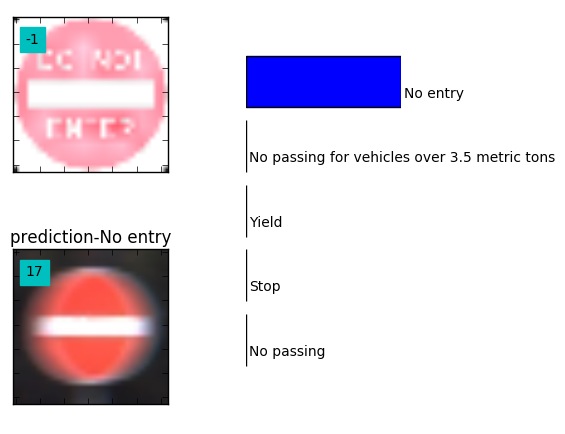

prob  [  1.00000000e+00   2.78568252e-10   9.92670945e-11   9.06686184e-11
   8.69036024e-11]
outp  [14 29  1 18  3]


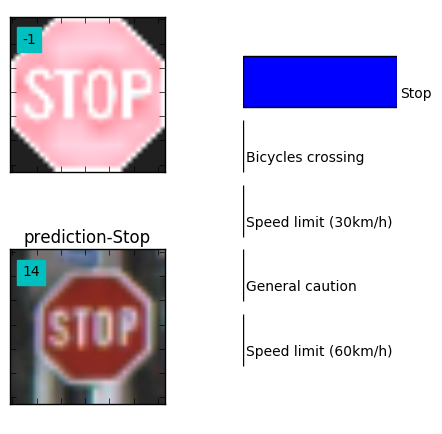

prob  [  9.99993086e-01   2.23118673e-06   1.34428296e-06   9.26836719e-07
   8.46796013e-07]
outp  [40 34 36 37 12]


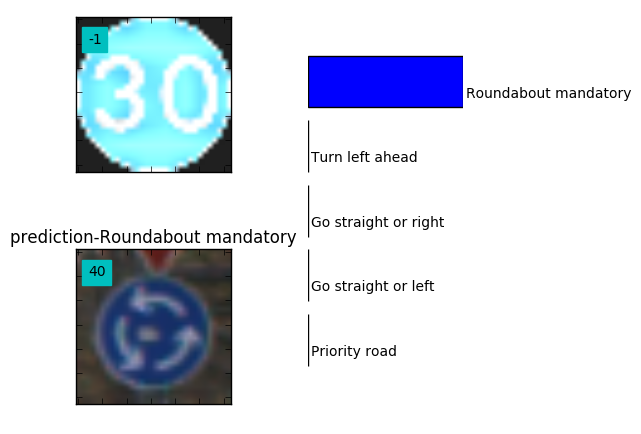

prob  [  9.97407019e-01   2.58726534e-03   5.76347975e-06   2.42472953e-09
   9.71189906e-10]
outp  [18 28 14 24  3]


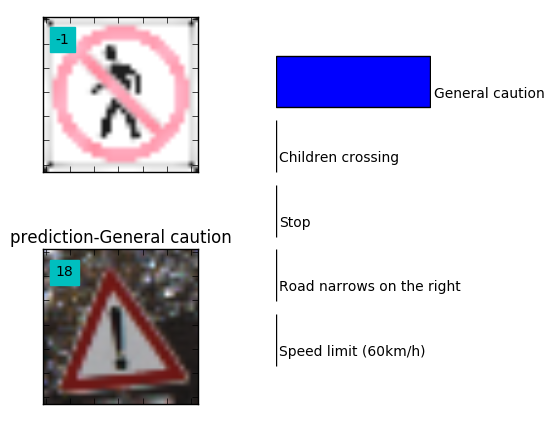

In [180]:

num_examples = len(external_img)
TEST_BATCH = 3000;
for offset in range(0, num_examples, TEST_BATCH):
    end = offset + TEST_BATCH
    batch_x = external_img[offset:end]
    top_k = top_k_predictions(batch_x,k=5)
    
    predictions = top_k[1][:,[0]].squeeze()
    for i in range(0,len(predictions)):
        input_img = external_img_src[i]
        input_img_class = -1  
        predicted_img = get_image_from_class(predictions[i])
        predicted_class = predictions[i]
        
        top_k_prob = top_k[0][i];
        top_k_class = top_k[1][i];
        
        display_predictions(input_img,predicted_img,input_img_class,predicted_class,top_k_prob,top_k_class)




### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

__Answer__

The softmax probabilities are printed along with the visualisation on question 7.

When looking at two signs yield and turn right in the same image the network is uncertain. 
* probabilities   =   [ 0.35758212  0.16480717  0.06160113  0.0543761   0.05219875]
* predicted class =   [40 39 38  9 37]

when looking at the cycle sign on a blue background - the network is certain that it is "go left or straight" sign. this is acceptable as the network has never encountered this image before and got the closest match.

* probabilities   =  [ 9.99477684e-01   2.85921094e-04   1.09795219e-04   7.61832198e-05 2.76001847e-05]
* predicted class =  [37 34 40 38 39]
